<a href="https://colab.research.google.com/github/jairajsahgal/covid_bar_chart_race/blob/master/Bar_Chart_Race_Covid_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [54]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
import datetime
df = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv')
# excludes = ["World", "Africa", "North America", "South America", "Asia", "Europe", 
#             "European Union", "High income", "Low income", "Lower middle income", 
#             "Oceania", "Upper middle income", "World excl. China", 
#             "World excl. China and South Korea", "International",
#             "World excl. China, South Korea, Japan and Singapore","Asia excl. China"]

# df=df[~df['Country'].isin(["World"])]
# df.columns = ['Country','Code','Date','Confirmed','Days since confirmed']
# df['Date']= pd.to_datetime(df['Date']).dt.strftime('%Y-%m-%d')
# df_all=df[(df['Date']>'2020-03-01') & (df['Date'] <'2020-06-14')]

In [55]:
df=df.iloc[:,[0,1,2,3,4,5]]
df=df.rename(columns={"iso_code":"Code","continent":"continent","location":"Country","date":"Date","total_cases":"Confirmed"})
df=df[~df['Country'].isin(["World"])]
print(df.columns)
print(df.head(10))

Index(['Code', 'continent', 'Country', 'Date', 'Confirmed', 'new_cases'], dtype='object')
  Code continent      Country        Date  Confirmed  new_cases
0  AFG      Asia  Afghanistan  2019-12-31        0.0        0.0
1  AFG      Asia  Afghanistan  2020-01-01        0.0        0.0
2  AFG      Asia  Afghanistan  2020-01-02        0.0        0.0
3  AFG      Asia  Afghanistan  2020-01-03        0.0        0.0
4  AFG      Asia  Afghanistan  2020-01-04        0.0        0.0
5  AFG      Asia  Afghanistan  2020-01-05        0.0        0.0
6  AFG      Asia  Afghanistan  2020-01-06        0.0        0.0
7  AFG      Asia  Afghanistan  2020-01-07        0.0        0.0
8  AFG      Asia  Afghanistan  2020-01-08        0.0        0.0
9  AFG      Asia  Afghanistan  2020-01-09        0.0        0.0


In [56]:
df.info()

df=df.fillna(0)
df.isnull().sum()
# df.columns=["Date","Confirmed","Country","Code"]
# print(df["Date"][0][0:2])
# print(df["Date"][0][4:5])
# print(df["Date"][0][6:])
# for i in range(len(df.index)):
#   # print(df["Date"][i])
#   df["Date"][i]=df["Date"][i][6:]+"-"+df["Date"][i][4:5]+"-"+df["Date"][i][0:2]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24363 entries, 0 to 24362
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Code       24363 non-null  object 
 1   continent  24363 non-null  object 
 2   Country    24363 non-null  object 
 3   Date       24363 non-null  object 
 4   Confirmed  24138 non-null  float64
 5   new_cases  24138 non-null  float64
dtypes: float64(2), object(4)
memory usage: 1.3+ MB


Code         0
continent    0
Country      0
Date         0
Confirmed    0
new_cases    0
dtype: int64

2020-06-19
Index(['Code', 'continent', 'Country', 'Date', 'Confirmed', 'new_cases'], dtype='object')


<BarContainer object of 10 artists>

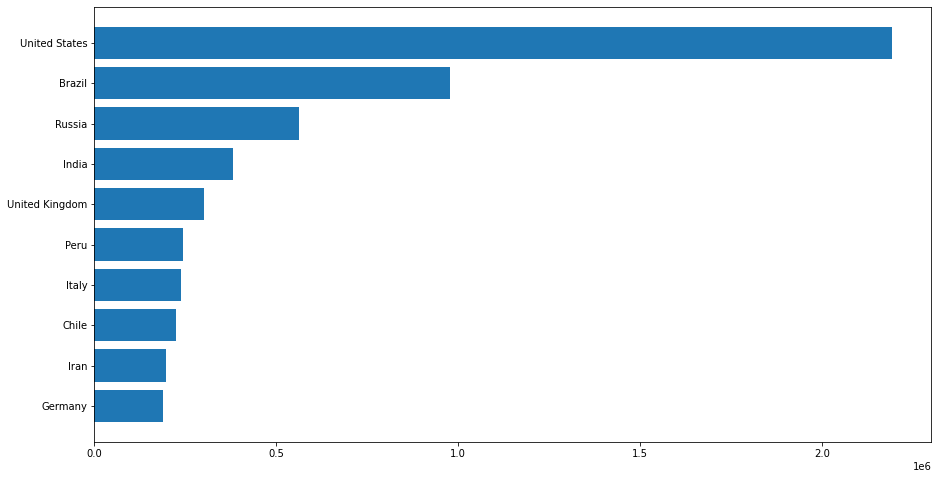

In [57]:
print(df["Date"].max())
print(df.columns)
# df.sort_values(by="Date",ascending=False).head(10)
dff=(df[df['Date'].eq(df["Date"].max())].sort_values(by="Confirmed",ascending=False).head(10))
dff=dff.reindex(index=dff.index[::-1])
fig,ax=plt.subplots(figsize=(15,8))
ax.barh(dff['Country'],dff['Confirmed'])

In [58]:
list1=df["Code"].unique().tolist()
print(len(list1))

colour_blind=['#cd98a2', '#7aa1ff','#E5BE01', '#ffddd3', '#33ff66', '#8f8c8b', '#796a71', '#6600cc', '#847064', '#663399', '#a7875c', '#00cc66', '#003399', '#cfcbcb', '#b87178', '#cc3300', '#ffc857', '#aaa5a0', '#009099', '#686666', '#615b68', '#ffcd78', '#ffe75c', '#326ed5', '#666699', '#005e9a', '#0079f2', '#666633', '#719cff', '#ff9900', '#82becd', '#90eeff', '#ecd435', '#356fd5', '#645b2f', '#99ff99', '#d3c4d3', '#86a9b6', '#006f74', '#a27e3d', '#ff66cc', '#005ebf', '#fa4042', '#767591', '#c99b32', '#99ffcc', '#5e98f1', '#82a0f6', '#ecd30f', '#669999', '#57d1e1', '#cc6666', '#a59b7c', '#ede1bd', '#a98200', '#336600', '#ff3332', '#c8b65e', '#cccc99', '#330000', '#838fc0', '#7e8791', '#a6efff', '#b76a71', '#cc00ff', '#ffdecc', '#cccccc', '#3333ff', '#ad841c', '#ffff99', '#74909a', '#76efff', '#b19992', '#ff666c', '#bfa9b6', '#8093cd', '#ff3366', '#009933', '#ffffcc', '#8c8a90', '#a5bbff', '#cc0099', '#ffea86', '#ff00cc', '#91d1e1', '#b9b7bf', '#cab500', '#99cc99', '#33cc99', '#669933', '#0066cc', '#373133', '#59699c', '#856726', '#fc9faa', '#563f44', '#ffbeca', '#9d5f66', '#005d96', '#c4ceff', '#ccff99', '#dec6cd', '#008de8', '#6f6300', '#0070e1', '#bb955e', '#0066ff', '#1e1b08', '#aebbf2', '#55514a', '#666666', '#4a420b', '#ff6699', '#00cc99', '#635800', '#8f6d00', '#660033', '#003f67', '#6666cc', '#996666', '#330099', '#8a92c1', '#d7c1cf', '#3366ff', '#00ffcc', '#9d8b8f', '#e0ac2e', '#674f00', '#0074ea', '#993366', '#00595e', '#c4c1c6', '#fee65e', '#fccd99', '#8befff', '#42545b', '#005995', '#cc0033', '#99ccff', '#856f5f', '#a8801a', '#586a98', '#9a656c', '#33ffff', '#993300', '#660099', '#705600', '#918f93', '#f7e9c1', '#ccffff', '#baa198', '#963d40', '#ff3300', '#ff949d', '#ffd080', '#cccc33', '#ffff33', '#47c4d3', '#7e6a5e', '#bdbbc1', '#b9c4ff', '#cc66cc', '#0090ee', '#9a8b23', '#d2b29f', '#66cc66', '#7f8ec3', '#b4eeff', '#cc00cc', '#cf5f65', '#00d0df', '#9d826b', '#74efff', '#663336', '#b1b8e0', '#999900', '#c5b000', '#004347', '#ccff66', '#363033', '#6666ff', '#66cc00', '#19376a', '#339966', '#83a4ff', '#ffca6f', '#385b90', '#ccff33', '#cc33ff', '#cc3399', '#cecad9', '#46433a', '#8cabff', '#54c1cf', '#73eeff', '#c49d65', '#663366', '#cc9999', '#0059b4', '#415f66', '#fbe790', '#1f97a3', '#78746d', '#9b8b2f', '#6c552d', '#a3c4d3', '#bbb3d1', '#a4876a', '#ff0066', '#cc3366']

207


In [59]:
colors=dict(zip(list1,colour_blind))
group_lk=df.set_index('Country')['Code'].to_dict()

Text(1, 0.4, '2020-06-19')

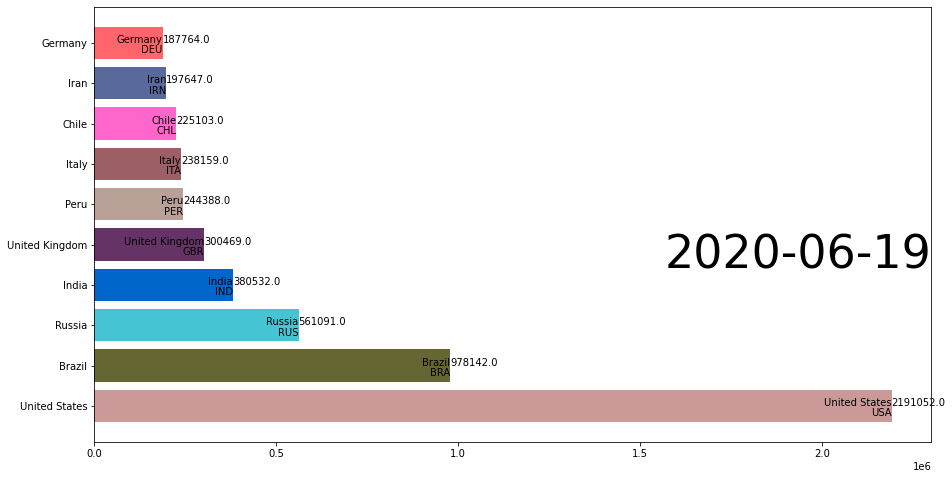

In [60]:
fig,ax=plt.subplots(figsize=(15,8))
dff=dff[::-1] #flip values from to bottom
#pass colors values to color=
ax.barh(dff['Country'],dff['Confirmed'],color=[colors[group_lk[x]] for x in dff['Country']])
for i,(value,name) in enumerate(zip(dff['Confirmed'],dff['Country'])):
  ax.text(value,i,name,ha='right') #tokyo: name
  ax.text(value,i-.25,group_lk[name],ha='right') #asia : group name
  ax.text(value,i,value,ha='left') #28194.2
  #Add year right middle portion of canvas
ax.text(1,0.4,df["Date"].max(),transform=ax.transAxes,size=46,ha='right')

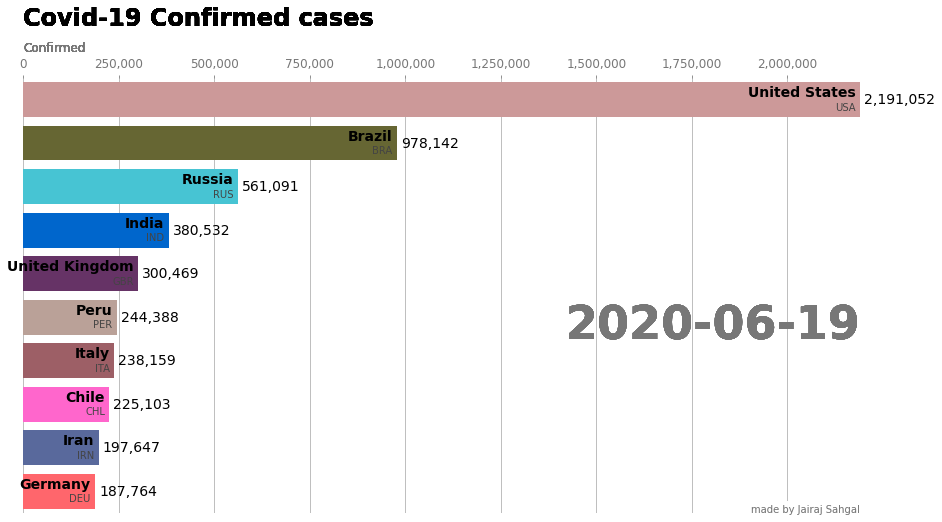

In [61]:
fig,ax=plt.subplots(figsize=(15,8))
def draw_barchart(year):
  dff=df[df['Date'].eq(year)].sort_values(by='Confirmed',ascending=True).tail(10)
  ax.clear()
  ax.barh(dff['Country'],dff['Confirmed'],color=[colors[group_lk[x]] for x in dff['Country']])
  dx=dff['Confirmed'].max()/200
  for i,(value,name) in enumerate(zip(dff['Confirmed'],dff['Country'])):
    ax.text(value-dx,i,name,size=14,weight=600,ha='right',va='bottom')
    ax.text(value-dx,i-.25,group_lk[name],size=10,color='#444444',ha='right',va='baseline')
    ax.text(value+dx,i,f'{value:,.0f}',size=14,ha='left',va='center')
    #...polished styles
    ax.text(1,0.4,year,transform=ax.transAxes,color='#777777',size=46,ha='right',weight=800)
    ax.text(0,1.06,'Confirmed',transform=ax.transAxes,size=12,color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',colors='#777777',labelsize=12)
    ax.set_yticks([])
    ax.margins(0,0.01)
    ax.grid(which='major',axis='x',linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0,1.12,'Covid-19 Confirmed cases',transform=ax.transAxes,size=24,weight=600,ha='left')
    ax.text(1,0,'made by Jairaj Sahgal',transform=ax.transAxes,ha='right',color='#777777',bbox=dict(facecolor='white',alpha=0.8,edgecolor='white'))
    plt.box(False)
draw_barchart(df["Date"].max())

In [62]:
# print(min(df["Date"]))
# print(max(df["Date"]))
# print(df["Date"].sort_values())

np.sort(df["Date"].unique())
len(np.sort(df["Date"].unique()))

172

# FOR COLOUR BLIND PEOPLE

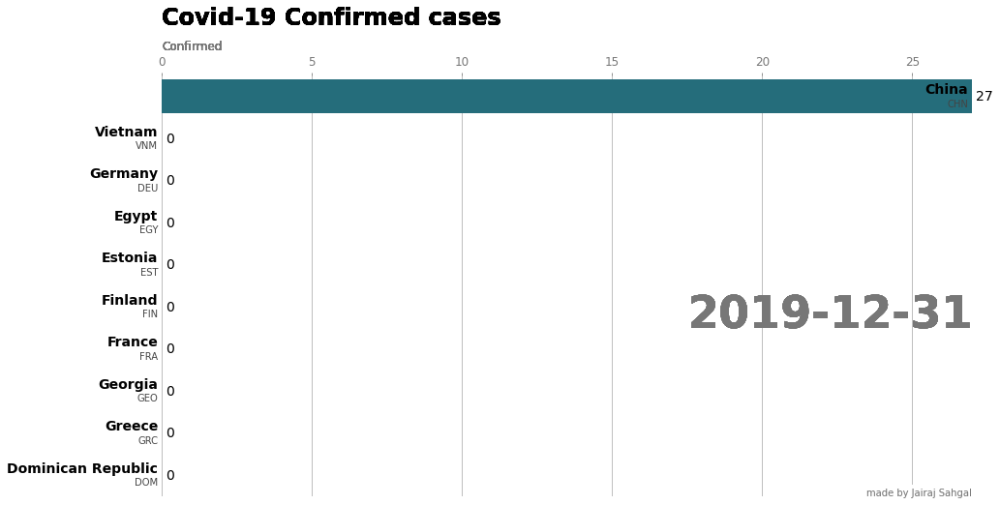

In [67]:

fig, ax=plt.subplots(figsize=(15,8))
animator=animation.FuncAnimation(fig,draw_barchart,frames=np.sort(df["Date"].unique()))
HTML(animator.to_jshtml())


In [66]:
HTML(animator.to_html5_video())